# Learning the command line

You can do data science in jupyterlab and Visual Studio Code, and using your operating system's file manager. But this is like driving a Ferrari in the slow lane.

Data Science is usually done on unix-like systems, and it is important to learn the skills that let your Ferrari purr. You want to be able to deal with multiple pieces of data fast, set up repeatable data science analysis pipelines, and put code into production.

## What you will learn

All of these require learning the Unix Command Line.

This workshop aims to do just that. It will teach you Unix Command Line basics. 

We will start with the very basic file and folder manipulations. From here you will learn the concepts of standard input and standard output, and how you can organize your work into pipelines. You will learn some useful unix commands and how these are organized into pipelines.

You will learn how to download data and process it end-to-end, including putting your usual notebook based python analysis code into the pipeline. And then you will learn how to run this pipeline on multiple data files, a usual situation in many data science projects.

At the end of this workshop, there is a homework. By completing this workshop and this homework, you will have increased the efficiency and productivity of your data science work. Stick with using the command line: over time you will learn new tricks and skills and become super fast at organizing and automating your analysis pipelines.

### Setup

To follow along (and you should follow along), you can stay on this notebook on Colab. But it may be even better for you to do the following.

- On Linux, open up a terminal. It will dump you in a "Unix Shell", most likely, the shell `bash`.
- On Mac search for the Terminal.app application (comes with MacOS) (or iterm2 application if you have installed it). It will dump you into the `zsh` shell.
- On Windows, download `git-bash` from [here](https://gitforwindows.org). This will give you a nice unix like `bash` shell for windows. Look for the `git-bash` terminal application and start it. It will dump you into a `bash` shell.

If you decide to stay here on Colab, run the next cell. It will set up a terminal with a `bash` shell on colab for you. Or you can get a terminal directly on Colab if you have paid for Colab Pro (check geography before you do this).

*The Colab terminal software is still buggy. Exit out of each xterm session or you will have an infinite scroll of html code in those sessions*

In [2]:
!pip install git+https://github.com/rahuldave/colab-xterm

  Cloning https://github.com/rahuldave/colab-xterm to /tmp/pip-req-build-xriv96pg
  Running command git clone -q https://github.com/rahuldave/colab-xterm /tmp/pip-req-build-xriv96pg
  Created wheel for colab-xterm: filename=colab_xterm-dev-py3-none-any.whl size=115312 sha256=84901e691a0e7c44d64c421546c760fa2f9ee00dade341209dafa8d78ed67042
  Stored in directory: /tmp/pip-ephem-wheel-cache-k0krccpd/wheels/bd/64/67/7832abf303775fbc1c3983da841a508c3f56ebd74212b2be63
Failed to build colab-xterm
    Running setup.py install for colab-xterm ... done
  DEPRECATION: colab-xterm was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [3]:
%load_ext colabxterm

Now we are ready to go!

## Benefits of learning the command line

- agility of data science exploration using the "shell prompt"
- easy programmatic access to the file system and thus the files that form your data
- augmentation of your Python and R code, the ability to call these from the command line
- the shell is a language: so instead of clicking you are talking to your computer
- extensible, you can combine commands, make new ones

## Moving around in folders

Ok, so lets start. 

The first thing we will do is customize our prompt so we can see which folder we are in.

```bash
export PS1="\e[1;36m \W\e[m "
```

Or if you are working with the zsh, you can use

```zsh
export PS1=" %B%F{cyan}%1~%f%b "
```

We'll now:

1. See where we are `pwd` which stands for present working directory
2. Create a new folder `mkdir newfolder` using the command `mkdir` which ceates a new directory (folder) for us
3. We'll enter this folder using the command `cd` (change-directory) by doing `cd newfolder`
4. As part of this process we will create a subfolder and list it
5. We will leave our folder by doing `cd ..` which takes us one folder up. Doing `cd` with no arguments takes us to our home folder.

Since I am on colab I also issue an `exit` because the software we are using is a hacky way to get the terminal and I want you to see the output of your commands in this notebook later. On your own machines `exit` will exit your shell and quite likely kill your terminal window.

```bash
/content# pwd
/content
/content# mkdir newfolder
/content# ls
newfolder  sample_data
/content# cd newfolder
/content/newfolder# mkdir subfolder
/content/newfolder# ls
subfolder
/content/newfolder# pwd
/content/newfolder
/content/newfolder# cd ..
/content# pwd
/content
/content# ls
newfolder  sample_data
/content# cd
~# pwd
/root
~# exit
```

In [5]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

We'll play with `ls` a little:

1. We'll create an empty file inside `newfolder` by using the `touch` command: `touch emptyfile.txt`
2. Now we'll see the contents of a folder by typing `ls` which is a short form for list. Common variations on `ls` are `ls -1` (sort listing), `ls -l` (long listing), `ls -a` (show hidden files). `ls -F` lists subfolders with trailing slashes. `ls --color` on linux and `ls -G` on Mac ads color to the listings. These "options" can be combined. A folder argument to `ls` lists files in that folder instead.

```bash
/content# cd newfolder
/content/newfolder# ls -l
total 4
drwxr-xr-x 2 root root 4096 Feb 16 16:13 subfolder
/content/newfolder# touch emptyfile.txt
/content/newfolder# ls 
emptyfile.txt  subfolder
/content/newfolder# ls -1
emptyfile.txt
subfolder
/content/newfolder# ls -l
total 4
-rw-r--r-- 1 root root    0 Feb 16 16:15 emptyfile.txt
drwxr-xr-x 2 root root 4096 Feb 16 16:13 subfolder
/content/newfolder# ls -a
.  ..  emptyfile.txt  subfolder
/content/newfolder# ls -la
total 12
drwxr-xr-x 3 root root 4096 Feb 16 16:15 .
drwxr-xr-x 1 root root 4096 Feb 16 16:13 ..
-rw-r--r-- 1 root root    0 Feb 16 16:15 emptyfile.txt
drwxr-xr-x 2 root root 4096 Feb 16 16:13 subfolder
/content/newfolder# exit
```

In [6]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

You'll notice that we created a file `emptyfile.txt` by using the `touch` command. And you know its empty because when you ask for the "long" folder listing using `ls -l`, it tells you:

`-rw-r--r-- 1 root root    0 Feb 16 16:15 emptyfile.txt`

The 0 in there corresponds to 0 bytes. And next to it is the date and time when the file was created. At this point you might want to see when files were created using the `t` argument, and using `r` for reverse sorting by time. Also notice the use of `.` which stands for the current folder, distinct from `..` which stands for the parent folder.

```bash
content# ls -lt newfolder
total 4
-rw-r--r-- 1 root root    0 Feb 16 16:15 emptyfile.txt
drwxr-xr-x 2 root root 4096 Feb 16 16:13 subfolder
/content# ls -lrt newfolder
total 4
drwxr-xr-x 2 root root 4096 Feb 16 16:13 subfolder
-rw-r--r-- 1 root root    0 Feb 16 16:15 emptyfile.txt
/content# ls -lrta .
total 20
drwxr-xr-x 4 root root 4096 Feb  1 14:31 .config
drwxr-xr-x 1 root root 4096 Feb  1 14:32 sample_data
drwxr-xr-x 1 root root 4096 Feb 16 15:31 ..
drwxr-xr-x 1 root root 4096 Feb 16 16:13 .
drwxr-xr-x 3 root root 4096 Feb 16 16:15 newfolder
/content# exit
```

In [7]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

## Creating Files, Standard Input and Standard Output

You have already seen how to create an empty file using the `touch` command. There are other ways to create files as well.

A key concept in the command line is that of **standard output**. When run any command, its output is displayed on the terminal. This works because every command sends its output to a standardized unix file descriptor called the standard output. This output is picked up by the terminal and displayed. 

For example, the unix command `echo` just "echoes" whatever arguments you give it to the standard output. This is now sent to the terminal. However, you can *intercept* this standard output and **re-direct** it to a file instead. There are two "operators" for this `>` which creates a new file and outputs to it, and `>>` which appends to an existing file.

Once you do this, how do you see whats in the file? Unix provides a handy dandy `cat` command, which takes the contents of the file and puts them on the standard output.

```bash
/content# cd newfolder/
/content/newfolder# echo "Hello World"
Hello World
/content/newfolder# echo "Hello World" > hello.txt
/content/newfolder# cat hello.txt 
Hello World
/content/newfolder# echo "Hello World Part 2" >> hello.txt
/content/newfolder# cat hello.txt 
Hello World
Hello World Part 2
/content/newfolder# ls -lart
total 16
drwxr-xr-x 1 root root 4096 Feb 16 16:13 ..
drwxr-xr-x 2 root root 4096 Feb 16 16:13 subfolder
-rw-r--r-- 1 root root    0 Feb 16 16:15 emptyfile.txt
drwxr-xr-x 3 root root 4096 Feb 16 17:03 .
-rw-r--r-- 1 root root   31 Feb 16 17:03 hello.txt
/content/newfolder# cd ..
/content# exit
```

In [8]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

The flip side of standard output is **standard input**. This is a file descriptor from which data can be fed to programs. The programs need to be capable of taking standard input. For example, you can feed `cat` the standard input rather than a filename, and it will just echo it out. This is how you do it...

```bash
/content# cd newfolder/
/content/newfolder# ls
emptyfile.txt  hello.txt  subfolder
/content/newfolder# < hello.txt cat
Hello World
Hello World Part 2
/content/newfolder# cat hello.txt
Hello World
Hello World Part 2
/content/newfolder# cd ..
/content# exit
```

In [9]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

So this seems neither very useful nor very different from just `cat`ting a file. But the beauty of this structure comes out in connecting the standard output of one program to the standard input of another program without any intermediate file. This is the concept of the unix **pipe** and program pipelines in general, which is all the rage in computing circles. The syntax for this is particularly easy in unix, and uses the `|` symbol like so `program1 | program2`, which means: redirect the standard output of `program1` to the standard input of `program2`. Let us use this to calculate the number of characters, words, and lines in our file `hello.txt` using the program `wc` or word-count.

```bash
/content# cd newfolder
/content/newfolder# cat hello.txt 
Hello World
Hello World Part 2
/content/newfolder# cat hello.txt | wc -l
2
/content/newfolder# cat hello.txt | wc -w
6
/content/newfolder# cat hello.txt | wc -c
31
/content/newfolder# cd ..
/content# exit
```

In [10]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

This particular example does not need pipes however, since you can use `wc` directly on files. There are many commands which work in this dual mode, and unix command designers try and make their programs useful enough to work with arguments as well as standard input. Here are the examples of `head` and `tail` which give you the beginning and end of files.

```bash
/content# cd newfolder/
/content/newfolder# wc -l hello.txt 
2 hello.txt
/content/newfolder# head -1 hello.txt 
Hello World
/content/newfolder# tail -1 hello.txt
Hello World Part 2
/content/newfolder# cat hello.txt | tail -1
Hello World Part 2
/content/newfolder# 
```

In [11]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

## More moving around...

Lets finish this section on preliminary commands with a few more examples related to file manipulation:

1. `cp` lets us copy one file to another
2. `mv` lets us move one file to another
3. You can pass "globs" to commands in Unix. For example you can say `ls *.txt` to only list text files. The same globs can be passed to other commands and can even be used to iterate over files of a particular type, which is useful in writing new programs.
4. `rm` lets us remove a file. `rmdir` will let us remove an empty folder.

```bash
/content# cd newfolder
/content/newfolder# ls
emptyfile.txt  hello.txt  subfolder
/content/newfolder# cp hello.txt hello2.txt
/content/newfolder# cp hello.txt hello.md
/content/newfolder# cp hello.txt hello3.txt
/content/newfolder# ls
emptyfile.txt  hello2.txt  hello3.txt  hello.md  hello.txt  subfolder
/content/newfolder# mv hello3.txt hello2.md
/content/newfolder# ls
emptyfile.txt  hello2.md  hello2.txt  hello.md  hello.txt  subfolder
/content/newfolder# ls *.txt
emptyfile.txt  hello2.txt  hello.txt
/content/newfolder# ls *.md
hello2.md  hello.md
/content/newfolder# rm hello2.md
/content/newfolder# ls
emptyfile.txt  hello2.txt  hello.md  hello.txt  subfolder
/content/newfolder# rmdir subfolder
/content/newfolder# exit
```

In [12]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

## Writing your first unix program

Ok so this is all very fine, but when you create files, you want to make reasonably sized ones. For this you can use your usual tools such as visual studio code. But almost all unix systems come with a command line editor, `nano` which is quite use friendly and fast.

Here we'll make a file and copy "I am good." and "I am bad." as alternating lines in there. Create 4 or so repetitions. On the last line put in "I am crazy." Those on colab can use the colab text editor. Make `larger.txt` in `newfolder`.

Try some of the commands you learned on this larger file. 

```bash
/content# cd newfolder
/content/newfolder# wc -l larger.txt
9 larger.txt
/content/newfolder# wc -c larger.txt
96 larger.txt
/content/newfolder# head -5 larger.txt
I am good.
I am bad.
I am good.
I am bad.
I am good.
/content/newfolder# tail -5 larger.txt
I am good.
I am bad.
I am good.
I am bad.
I am crazy.
/content/newfolder# exit
```

In [5]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

How do you read such a file, one page at a time? The command for this is `less`, which can also be passed standard input. The `space` bar advances a page, `ctrl-b` goes one page back, `q` quits the program..

```bash
/content# cd newfolder
/content/newfolder# less larger.txt
/content/newfolder# exit
```

In [6]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

Ok so lets do some more text analysis with this:

The command `tr` lets us make "translation of characters" of the input text. `tr` works on standard input only, so you must find some way of sending the file as standard input.

For example, to translate lower case characters to upper case characters:

```bash
content# cd newfolder
/content/newfolder# < larger.txt tr "[:lower:]" "[:upper:]"
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM CRAZY.
```

Or you could `cat` the file and pass the standard output of `cat` as standard input for `tr` using a pipe.

```bash
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]"
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM CRAZY.
/content/newfolder# exit
```

In [7]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

Having done this, and thereby made sure that any differences in "bad" or "good" written on separate lines have been removed by this translation, we can do more manipulations. As in, how many unique lines in this file? And how many duplicates? This is given to us by the command `sort` which will sort these lines by their "alphanumeric value" and then `uniq` which will give us the unique lines and duplicated lines. So we'll set up a multi-stage pipeline with these commands in succession:

```bash
/content# cd newfolder
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]"
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM GOOD.
I AM BAD.
I AM CRAZY.
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort
I AM BAD.
I AM BAD.
I AM BAD.
I AM BAD.
I AM CRAZY.
I AM GOOD.
I AM GOOD.
I AM GOOD.
I AM GOOD.
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -u
I AM CRAZY.
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -d
I AM BAD.
I AM GOOD.
/content/newfolder# exit
```

In [10]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

`uniq -u` gives us the unique lines (here only "I AM CRAZY\n") and `uniq -d` gives us the lines that are duplicate.

You can even ask for the count of unique lines using `uniq -c`.

Why are these useful commands? What if I had a CSV file with repeated lines of data and wanted to get rid of these lines, leaving only the unique ones remaining. I can combine `uniq -u` with `uniq -d` and get the unique lines in the file.

```bash
content# cd newfolder/
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -u > unq.txt
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -d > dup.txt
/content/newfolder# cat unq.txt
I AM CRAZY.
/content/newfolder# cat dup.txt
I AM BAD.
I AM GOOD.
/content/newfolder# exit
```

In [11]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

To get the unique lines in the original file I need to concatenate these two files together and remove the individual files. How do we concatenate files together?

`cat` comes to our rescue. You can concatenate as many files as you like together at the command line. So our code now looks like:

```bash
/content# cd newfolder
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -u > unq.txt
/content/newfolder# cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -d > dup.txt
/content/newfolder# cat unq.txt dup.txt > unique.larger.txt
/content/newfolder# rm unq.txt dup.txt
/content/newfolder# cat unique.larger.txt 
I AM CRAZY.
I AM BAD.
I AM GOOD.
/content/newfolder# exit
```

In [13]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

We can now put this all into a file to create a **shell script** we can apply on any file, thus creating a *reusable* new unix command!

The shell script looks like this

```bash
#!/bin/bash
cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -u > unq.txt
cat larger.txt |  tr "[:lower:]" "[:upper:]" | sort | uniq -d > dup.txt
cat unq.txt dup.txt > unique.larger.txt
rm unq.txt dup.txt
```

You can put this text in a file `unique_lines.sh` using your favorite text editor or the colab editor, depending on where you are working.

Once you so that, you need to make this file **executable**, or, in pother words, a runnable unix program. Then run it by calling it as below:

```bash
/content# cd newfolder
/content/newfolder# chmod +x unique_lines.sh 
/content/newfolder# ./unique_lines.sh 
/content/newfolder# cat unique.larger.txt 
I AM CRAZY.
I AM BAD.
I AM GOOD.
/content/newfolder# exit
```

Notice the `./` at the beginning. That tells the operating system that the program is in the current folder and you are running it from there.

In [16]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

Ok, so this is all very nice and you have a working unix program. But, it is still stuck to the individual files we created. It does not generalize to other files.

If we want that to happen, we must let this program take arguments, just like the programs we have met so far.

There is a special syntax for this. The first argument is called `$1`, the second `$2` and so on. Using this syntax we can rewrite our program more generally:

```bash
# !/bin/bash
cat $1 |  tr "[:lower:]" "[:upper:]" | sort | uniq -u > unq.txt
cat $1 |  tr "[:lower:]" "[:upper:]" | sort | uniq -d > dup.txt
cat unq.txt dup.txt > unique.${1}
rm unq.txt dup.txt
```

Let's save these changes in `unique_lines2.sh` file using our favorite text editor. Then let us make it executable. We'll copy the file `larger.txt` to another file `myfile.txt` and run this unix program with that file as argument:

```bash
/content# cd newfolder
/content/newfolder# chmod +x unique_lines2.sh 
/content/newfolder# cp larger.txt myfile.txt
/content/newfolder# ./unique_lines2.sh myfile.txt
/content/newfolder# cat unique.myfile.txt 
I AM CRAZY.
I AM BAD.
I AM GOOD.
/content/newfolder# exit
```

In [17]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

And voila, just like that, you have first created your first generalize-able unix program!

## Putting it all together: a complex pipeline

You are now in the position to understand this piece of code, taken from Data Science on the Command Line which takes a text, gets all the words in the text, and finds their frequency. See https://datascienceatthecommandline.com/2e/chapter-4-creating-command-line-tools.html .

The code for this is:

```bash
$ curl -sL "https://www.gutenberg.org/files/11/11-0.txt" | ➊
> tr '[:upper:]' '[:lower:]' | ➋
> grep -oE "[a-z\']{2,}" | ➌
> sort | ➍
> uniq -c | ➎
> sort -nr | ➏
> head -n 10 ➐
   1839 the
    942 and
    811 to
    638 of
    610 it
    553 she
    486 you
    462 said
    435 in
    403 alice
```

where the numbers tell is what is going on:

- ➊ Downloading an ebook using `curl`. 
- ➋ Converting the entire text to lowercase using `tr`. 
- ➌ Extracting all the words using `grep` and put each word on separate line. 
- ➍ Sort these words in alphabetical order using `sort`. 
- ➎ Remove all the duplicates and count how often each word appears in the list using `uniq`. 
- ➏ Sort this list of unique words by their count in descending order using `sort`. `-n` is for numerical and `-r` is for reverse.
- ➐ Keep only the top 10 lines (i.e., words) using `head`.

In [5]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

The first thing to note here is the `curl` command. Either `curl` (macos) or `wget` (linux) can be used to obtain URLS. AT this point it becomes incumbent on us to understand what the "arguments do". For this you can use the `man` command to tell us what the manual for the command is, or on some systems `tldr` to give us examples. Or just google it. You'll find that `-s` is for silent, and `-L` instructs curl to follow redirects. You'll also find that `-o filename` will save the web page in `filename` whereas `-O` will construct the filename from the last part of the URL (no other argument is needed. `curl` by default writes to standard output, which is where `tr` can do its translation

Reading the man pages is critical in understanding what happens.

```bash
/content# curl -O "https://www.gutenberg.org/files/11/11-0.txt"
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  170k  100  170k    0     0   255k      0 --:--:-- --:--:-- --:--:--  255k
/content# ls
11-0.txt  sample_data
/content# exit
```

Notice that there are some download stats. Even though we redirected the standard outout to `11-0.txt` based on the `-O` option, there seems to be these stats on the terminal. This happens as the progress is directed to a third file descriptor, the **standard error**. That is where progress tracking, error messages, etc goes.

In [6]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

The other new command here is `grep`, which is very useful to go into files and find stuff. The general syntax is `grep search_term filename` with search terms as regular expressions or just plain strings. `-i` ignores case and `-n` gives the line number.

Here we define the regular expression: `"[a-z\']{2,}"` as a lowercase word of at-least 2 letters, and search for it in the output of the `tr`. Thus this gives us all words. The `-E` argument allows us to use the extended regular expression syntax, and `-o` outputs only the matching parts of each line, with each match separated by newlines. (Once again the man page comes to our rescue).

You'll notice that the words Out pipeline found are very generic. So lets get a list of stop-words to use to NOT match.

```bash
/content# curl -o stopwords.txt "https://raw.githubusercontent.com/stopwords-iso/stopwords-en/master/stopwords-en.txt"
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  7677  100  7677    0     0  43619      0 --:--:-- --:--:-- --:--:-- 43619
/content# head -10 stopwords.txt 
'll
'tis
'twas
've
10
39
a
a's
able
ableabout
```

In [9]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

We modify our pipeline to use these stop-words.

```bash
/content# curl -sL "https://www.gutenberg.org/files/11/11-0.txt" | tr '[:upper:]' '[:lower:]' | grep -oE "[a-z\']{2,}" | sort | grep -Fvwf stopwords.txt | uniq -c | sort -nr | head -n 10
    403 alice
     98 gutenberg
     88 project
     76 queen
     71 time
     63 king
     60 turtle
     57 mock
     56 hatter
     55 gryphon
/content# exit
```

There is now an additional `grep` in the pipeline: `grep -Fvwf stopwords.txt` From https://datascienceatthecommandline.com/2e/chapter-4-creating-command-line-tools.html :

>Obtain the patterns from a file (stop-words in our case), one per line, with `-f`. Interpret those patterns as fixed strings with `-F`. Select only those lines containing matches that form whole words with `-w`. Select non-matching lines with `-v`.

In [10]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

## Processing multiple files with your pipeline

We can download multiple files from Project Gutenburg, and might want to process these:

```bash
/content# curl -sLO "https://www.gutenberg.org/files/11/11-0.txt"
/content# curl -sLO "https://www.gutenberg.org/files/10/10-0.txt"
/content# curl -sLO "https://www.gutenberg.org/files/12/12-0.txt"
/content# curl -sLO "https://www.gutenberg.org/files/13/13-0.txt"
/content# ls *.txt
10-0.txt  11-0.txt  12-0.txt  13-0.txt  stopwords.txt
/content# ls 1*.txt
10-0.txt  11-0.txt  12-0.txt  13-0.txt
/content# exit
```

In [11]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

With the *wildcard glob* `1*.txt` we can capture the naming pattern of these files. Can we use these naming patterns and thus files in a loop to get "histograms" for each file? And while we are at it can we get the name of each book? Why yes we can!

```bash
/content# head -1 10-0.txt 
The Project Gutenberg eBook of The King James Bible
/content# for book in 1*.txt
> do
> head -1 $book
> cat $book | tr '[:upper:]' '[:lower:]' | grep -oE "[a-z\']{2,}" | sort | grep -Fvwf stopwords.txt | uniq -c | sort -nr | head -n 10
> done

The Project Gutenberg eBook of The King James Bible
   7964 lord
   4600 thy
   4472 god
   3827 thee
   2575 israel
   2548 king
   2392 son
   2264 hath
   2146 people
   2024 house
The Project Gutenberg eBook of Alice’s Adventures in Wonderland, by Lewis Carroll
    403 alice
     98 gutenberg
     88 project
     76 queen
     71 time
     63 king
     60 turtle
     57 mock
     56 hatter
     55 gryphon

    469 alice
    189 queen
     98 gutenberg
     88 project
     72 time
     71 red
     70 white
     67 king
     63 head
     59 knight
The Project Gutenberg eBook of The Hunting of the Snark, by Lewis Carroll
     97 gutenberg
     88 project
     37 snark
     34 bellman
     27 electronic
     23 terms
     22 foundation
     20 copyright
     19 beaver
     18 license
/content# exit
```

In [13]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

## Mixing it up with your Python data science code.

Finally, remember that we could save a script to make yet another unix command. But you have seen this, and so I have not bothered. But see https://datascienceatthecommandline.com/2e/chapter-4-creating-command-line-tools.html for considerations in doing this.

Remember that we do not want to do all our analysis in Python, but rather, we might want to use python as part of a pipeline. So we might prototype the pipeline as a set of unix commands, save the output to a file, and do something with it. For example, lets save the analysis of the Bible to a file:

```bash
/content# cat 10-0.txt | tr '[:upper:]' '[:lower:]' | grep -oE "[a-z\']{2,}" | sort | grep -Fvwf stopwords.txt | uniq -c | sort -nr > bible.wordfreq.txt
/content# head -15 bible.wordfreq.txt 
   7964 lord
   4600 thy
   4472 god
   3827 thee
   2575 israel
   2548 king
   2392 son
   2264 hath
   2146 people
   2024 house
   1821 children
   1743 day
   1718 land
   1616 shalt
   1466 hand
```

In [14]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

And now, we can use python to plot this

In [18]:
fd = open("bible.wordfreq.txt")
pairs = [line.strip().split() for line in fd.readlines()]
counts, words = zip(*pairs)
fd.close()
words[:10]

('lord',
 'thy',
 'god',
 'thee',
 'israel',
 'king',
 'son',
 'hath',
 'people',
 'house')

In [19]:
counts = [int(c) for c in counts]

<BarContainer object of 20 artists>

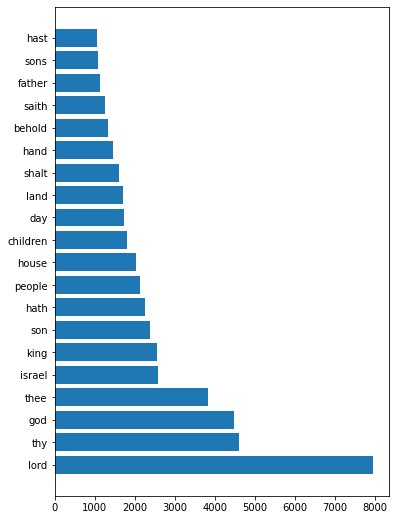

In [24]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(6, 9))
ax.barh(words[:20], counts[:20])

In [25]:
fig.savefig("bible.png")

In [28]:
from IPython.display import Image

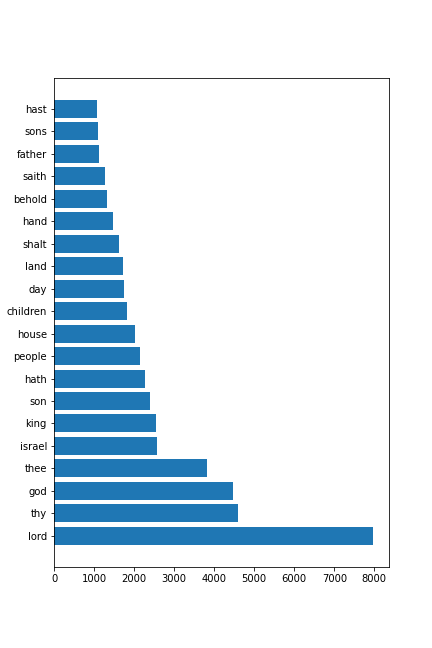

In [29]:
Image("bible.png")

Ok, so we now have a diagram, which we have prototyped in the notebook. But we dont want to have to run this notebook for every book in Gutenberg. So it makes sense for us to make the script into a program. But why should we even bother about saving the shell script output to a file. Why not have python simply read from the standard input?

In python `sys.stdin` is a file descriptor object and the usual methods like `read` and `readline` will work on it. So we'll remove the output of the name of the book (`head -1`) and just get the histogram info and go with it.

To prototype this code in the notebook I'll use `StringIO` from the io module or else the notebook will block waiting for standard input.

In [43]:
from io import StringIO 
import sys 
fd = open("bible.wordfreq.txt")
sys.stdin = StringIO(fd.read())
fd.close()

In [44]:
pairs = [line.strip().split() for line in sys.stdin.readlines()]
counts, words = zip(*pairs)
counts = [int(c) for c in counts]
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(6, 9))
ax.barh(words[:20], counts[:20])
plt.close(fig)
fig.savefig("output.png")

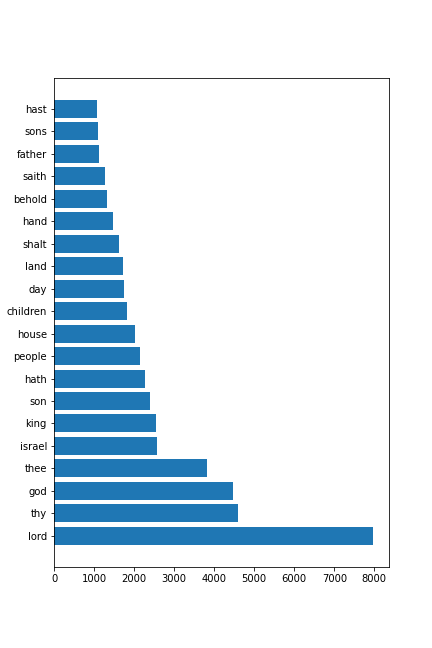

In [45]:
Image("output.png")

So now we save our work into a file, `plotbar.py` using `sys.argv[1]` as the filename to save image in and `sys.stdin` to read the words and counts from.

```python
#!/usr/bin/env python
import sys
import matplotlib.pyplot as plt
pairs = [line.strip().split() for line in sys.stdin.readlines()]
counts, words = zip(*pairs)
counts = [int(c) for c in counts]
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(6, 9))
ax.barh(words[:20], counts[:20])
plt.close(fig)
fig.savefig(sys.argv[1])
```


In [49]:
%%writefile plotbar.py
#!/usr/bin/env python
import sys
import matplotlib.pyplot as plt
pairs = [line.strip().split() for line in sys.stdin.readlines()]
counts, words = zip(*pairs)
counts = [int(c) for c in counts]
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(6, 9))
ax.barh(words[:20], counts[:20])
plt.close(fig)
fig.savefig(sys.argv[1])

Overwriting plotbar.py



Then we will make the file we save it in executable, and run it as part of our pipeline!

```bash
/content# chmod +x plotbar.py
/content# cat 10-0.txt | tr '[:upper:]' '[:lower:]' | grep -oE "[a-z\']{2,}" | sort | grep -Fvwf stopwords.txt | uniq -c | sort -nr | ./plotbar.py output2.png
```

In [47]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>

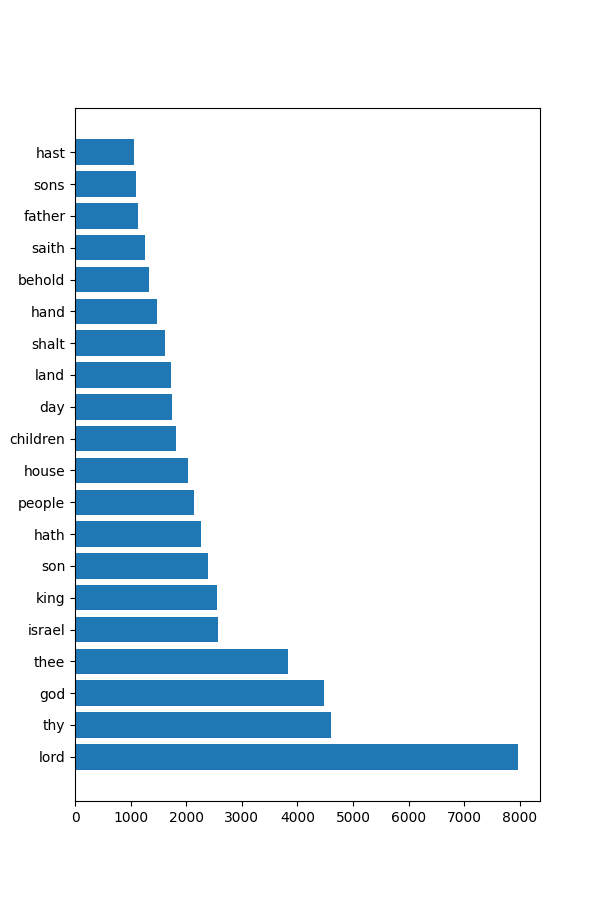

In [50]:
Image("output2.png")

Now we can combine this pipeline with a do loop and create multiple images at the same time. We could even label the plots using the name of the book.

## Homework

There are 6 CSV files at https://raw.githubusercontent.com/univai-ghf/ghfmedia/main/data/ which you can download: ALUR.csv, FLUR.csv, NYUR.csv, CAUR.csv, TNUR.csv, TXUR.csv. For example https://raw.githubusercontent.com/univai-ghf/ghfmedia/main/data/ALUR.csv gets you the file of unemployment rates for Alabama.

The following code using `awk`, `sed` will help you get the data from any one file into a form useful for plotting. You may have to consult the man pages of these commands for more help. Loop over all 6 URLs or files and create command line programs that make 6 plots for this data using a pipeline whose endpoint is a python script, just like above.

1. Use `sed` to convert both the comma's and the dashes to spaces. The general structure of a `sed` substitute command is `sed 's/c1/c2/g'` where the `g` stands for "globally". You can use `tr` instead as well.
2. To convert the dates into floating point numbers, ignore the day and add the month divided by 12 to the year using `awk`. In awk, the default separation of columns is by space, and `$1` refers to the first column, `$2` the second column and so on.
3. output this floating point column and the unemployment rate separated by space to the standard output. This is accomplished by the comma separated `print` in the `awk` command. The python script will pick this up as standard input
4. Loop over the 6 files or URLs to produce 6 plots. Include all your code in a notebook, and use `Image` to display the 6 plots in your notebook

```bash
/content#curl -Os https://raw.githubusercontent.com/univai-ghf/ghfmedia/main/data/ALUR.csv
/content# sed 's/-/ /g' ALUR.csv | sed 's/,/ /g' | tail -n +2 | head -13
1976 01 01 6.6
1976 02 01 6.6
1976 03 01 6.600
1976 04 01 6.500
1976 05 01 6.400
1976 06 01 6.500
1976 07 01 6.600
1976 08 01 6.7
1976 09 01 6.8
1976 10 01 6.9
1976 11 01 7.0
1976 12 01 7.2
1977 01 01 7.3
content# sed 's/-/ /g' ALUR.csv | sed 's/,/ /g' | tail -n +2 | awk '{print $1+($2/12.0), $4}' | head -13
1976.08 6.6
1976.17 6.6
1976.25 6.600
1976.33 6.500
1976.42 6.400
1976.5 6.500
1976.58 6.600
1976.67 6.7
1976.75 6.8
1976.83 6.9
1976.92 7.0
1977 7.2
1977.08 7.3
/content# exit
```

The `tail -n +2` says to tail starting with the second line.


In [55]:
%xterm

Launching Xterm...

<IPython.core.display.Javascript object>